In [1]:
import scanpy as sc 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

import scipy as sp
import scrublet as scr
from SCCAF import *

/home/sennis/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# get latent representation of data
adata_latent = sc.read('/data/sennis/AML/scarches_nf/data/latent/bone_marrow_merge_2000_20_latent.h5ad')
adata_latent

AnnData object with n_obs × n_vars = 351991 × 20
    obs: 'sample', 'celltype', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var'

/home/sennis/anaconda3/lib/python3.7/site-packages/numba/core/typed_passes.py:332: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/sennis/anaconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/sennis/anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/sennis/anaconda3/

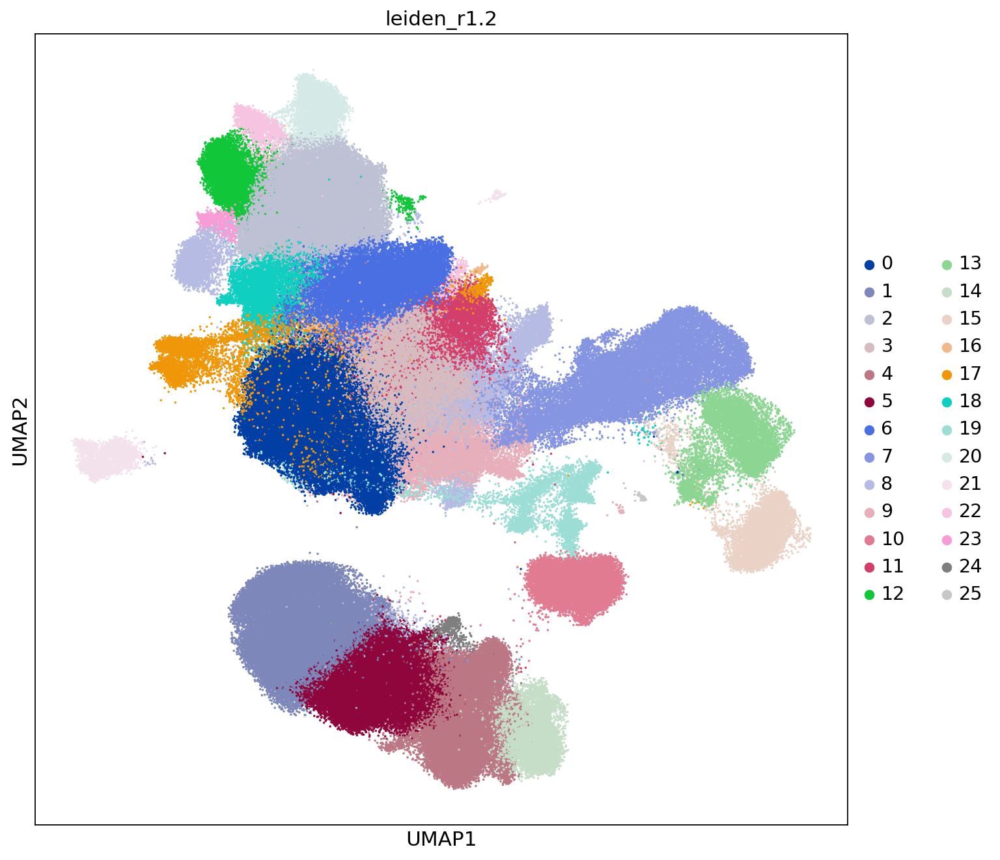

In [3]:
# find clusters in latent data
sc.pp.neighbors(adata_latent, n_neighbors=15)
sc.tl.umap(adata_latent)
sc.tl.leiden(adata_latent, resolution=1.2, key_added='leiden_r1.2')
sc.set_figure_params(figsize=(10, 10))
sc.pl.umap(adata_latent, color=['leiden_r1.2'], size = 10)

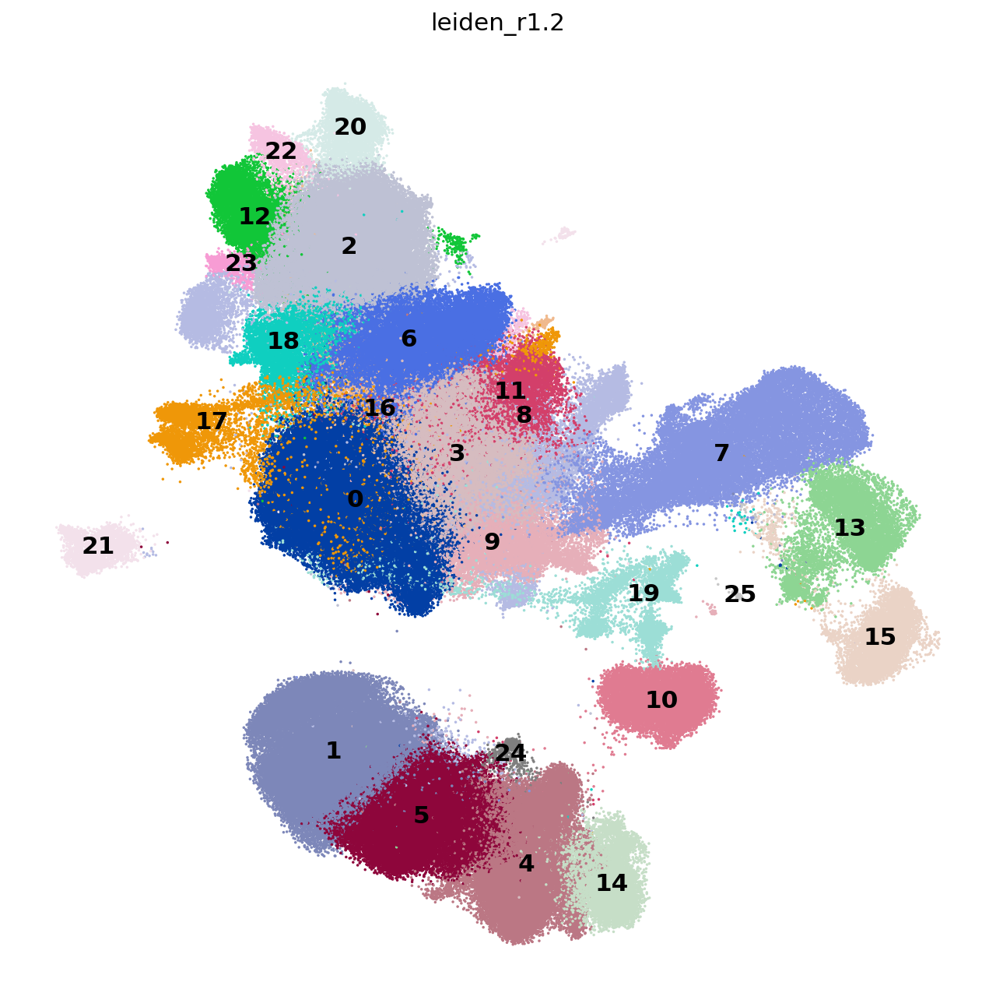

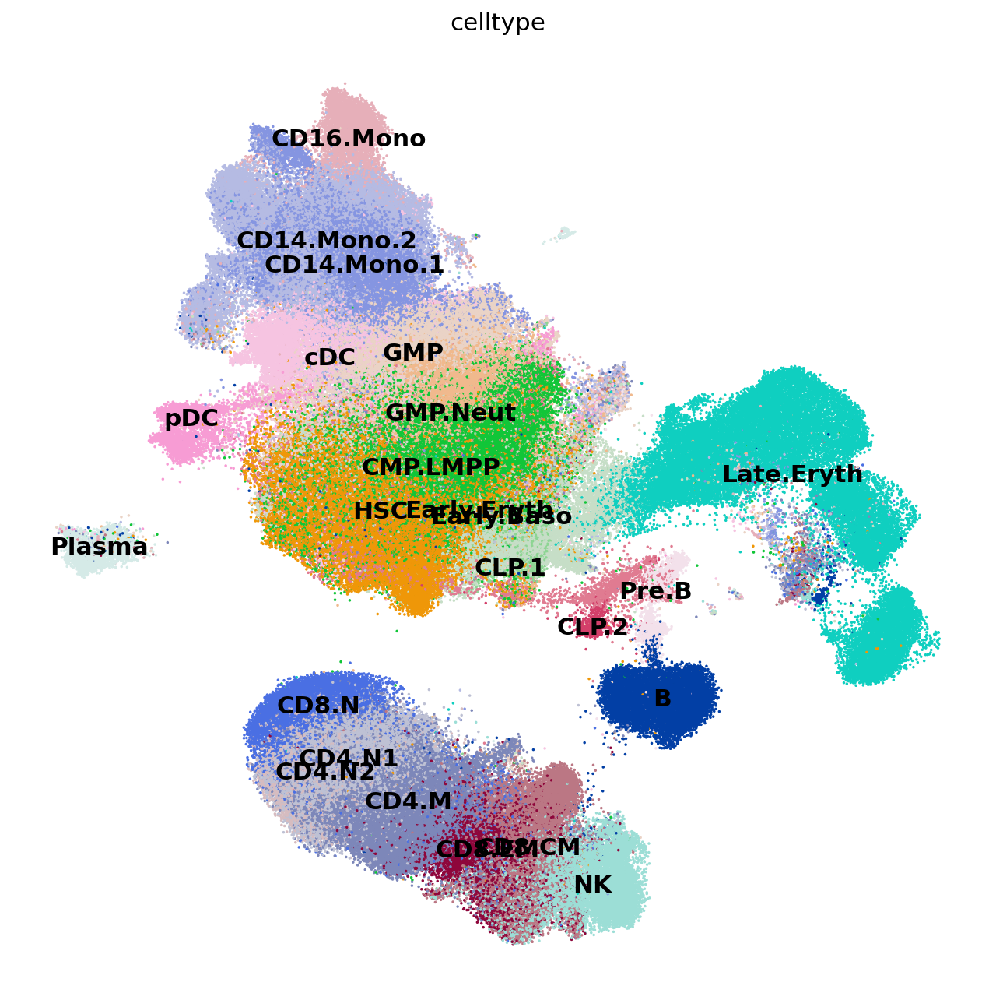

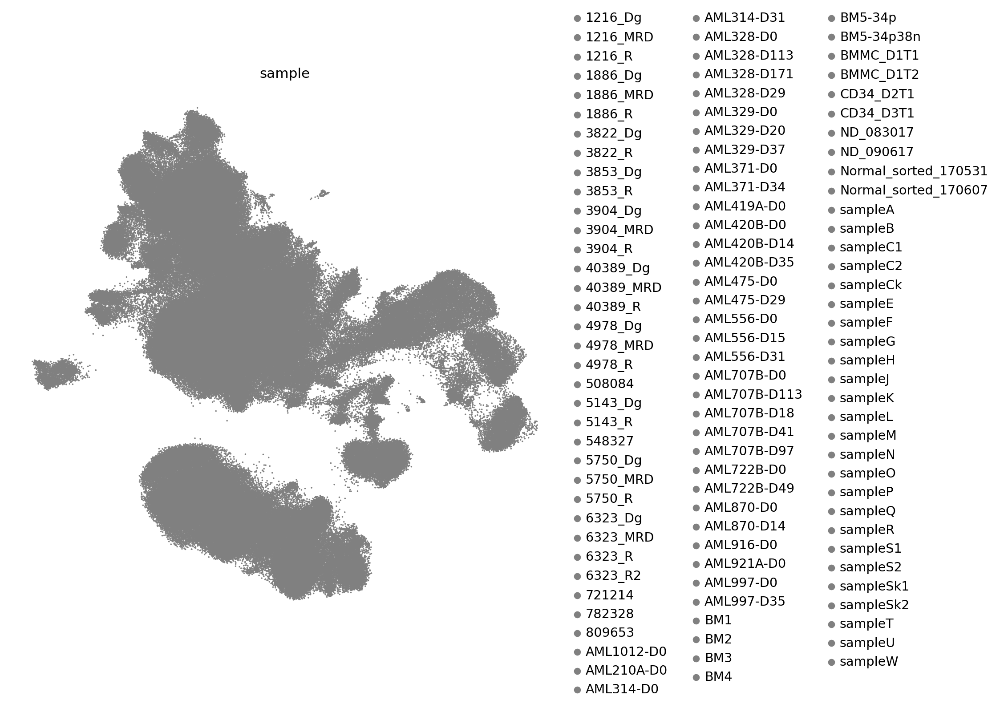

In [4]:
# look at clusters vs. cell type labels
sc.pl.umap(adata_latent, color = 'leiden_r1.2', size = 10, legend_loc = 'on data', frameon=False)
sc.pl.umap(adata_latent, color = 'celltype', size = 10, legend_loc = 'on data', frameon=False)
sc.pl.umap(adata_latent, color = 'sample', size = 10, frameon=False)

In [5]:
# load in gene expression data and add cluster labels and umap coordinates
adata = sc.read('../data/bone_marrow_merge.h5ad')
umap = pd.DataFrame(list(adata_latent.obsm['X_umap']), columns = ['umap1', 'umap2'])
umap.index = adata_latent.obs_names
umap['leiden'] = adata_latent.obs['leiden_r1.2']
umap.index = adata.obs_names
adata.obs['umap1'] = umap['umap1']
adata.obs['umap2'] = umap['umap2']
adata.obs['leiden'] = umap['leiden']

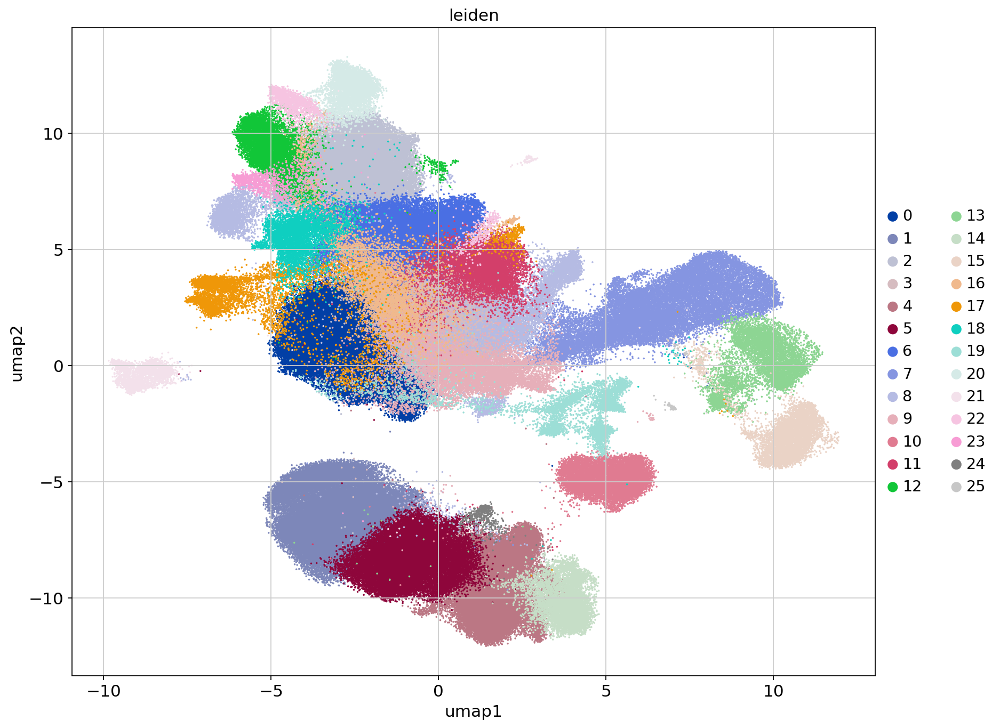

In [6]:
sc.pl.scatter(adata, x='umap1', y='umap2', color='leiden', size=10)

I want to try and find other rare cell types that you would expect to find in the bone marrow which might become more obvious now that all the datasets have been integrated. Starting with stromal cells - markers are CXCL12, VCAM1.

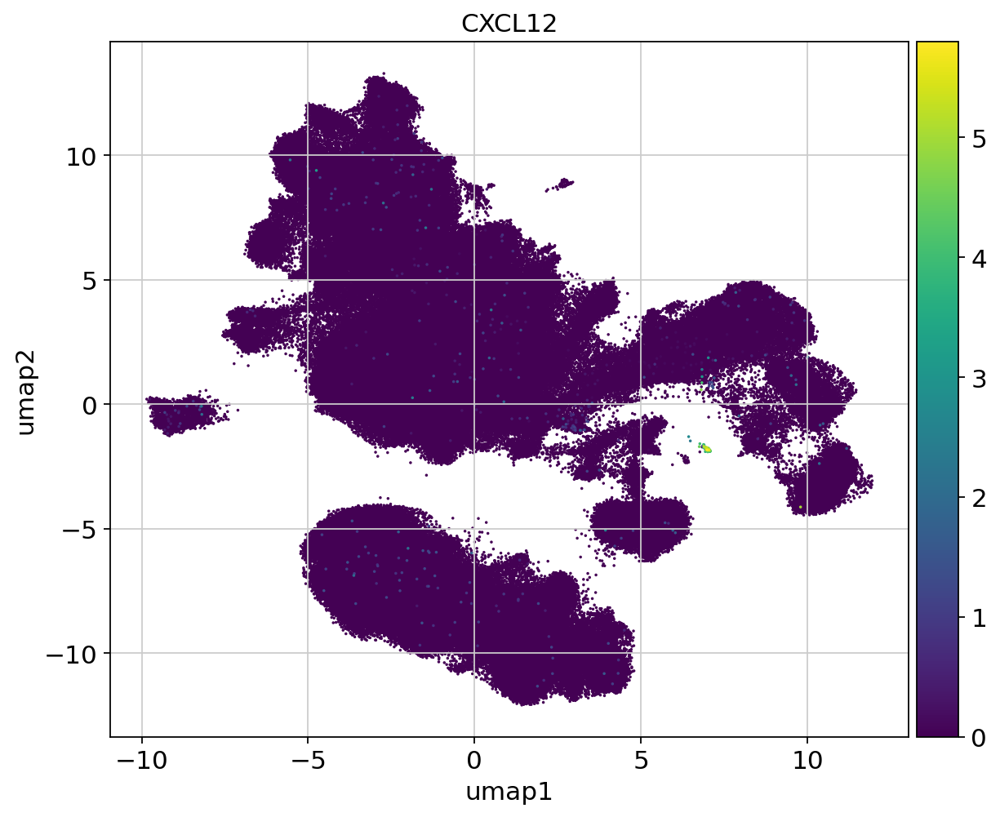

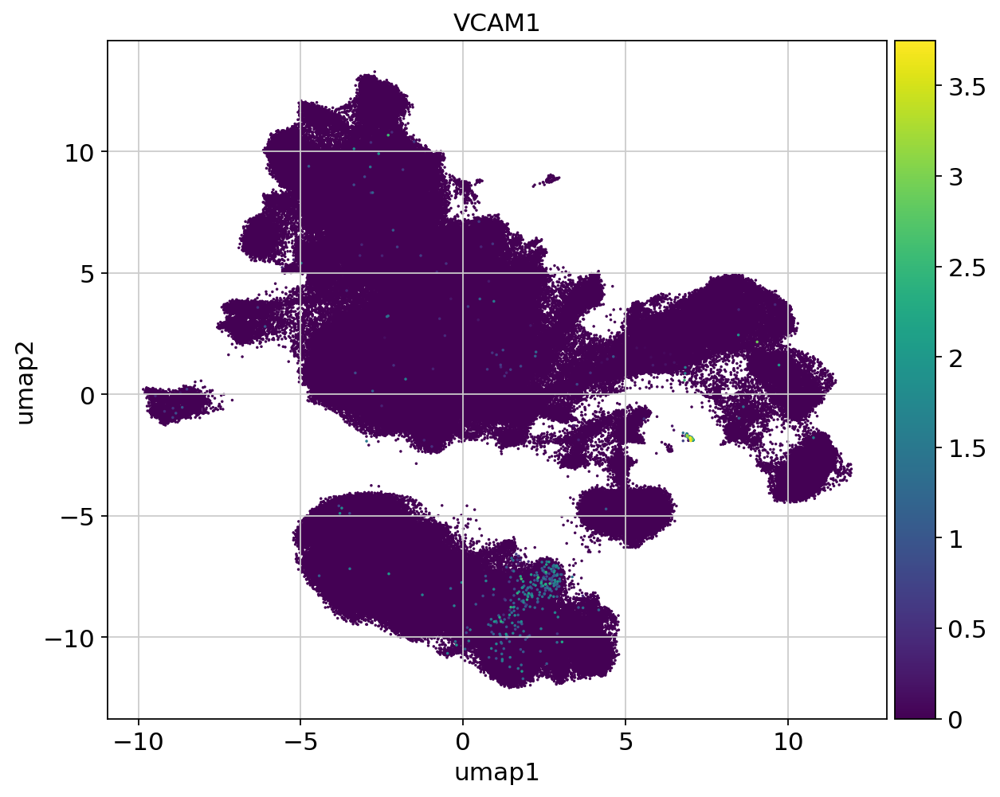

In [7]:
sc.set_figure_params(figsize=(7, 7))
sc.pl.scatter(adata, x='umap1', y='umap2', color='CXCL12', size=10)
sc.pl.scatter(adata, x='umap1', y='umap2', color='VCAM1', size=10)

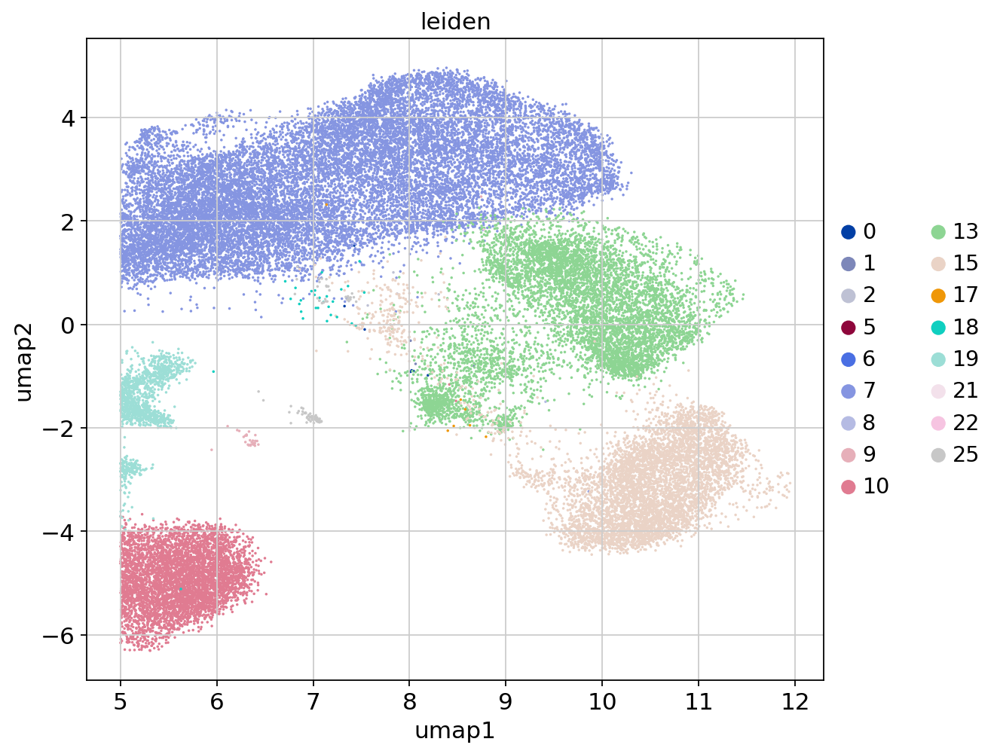

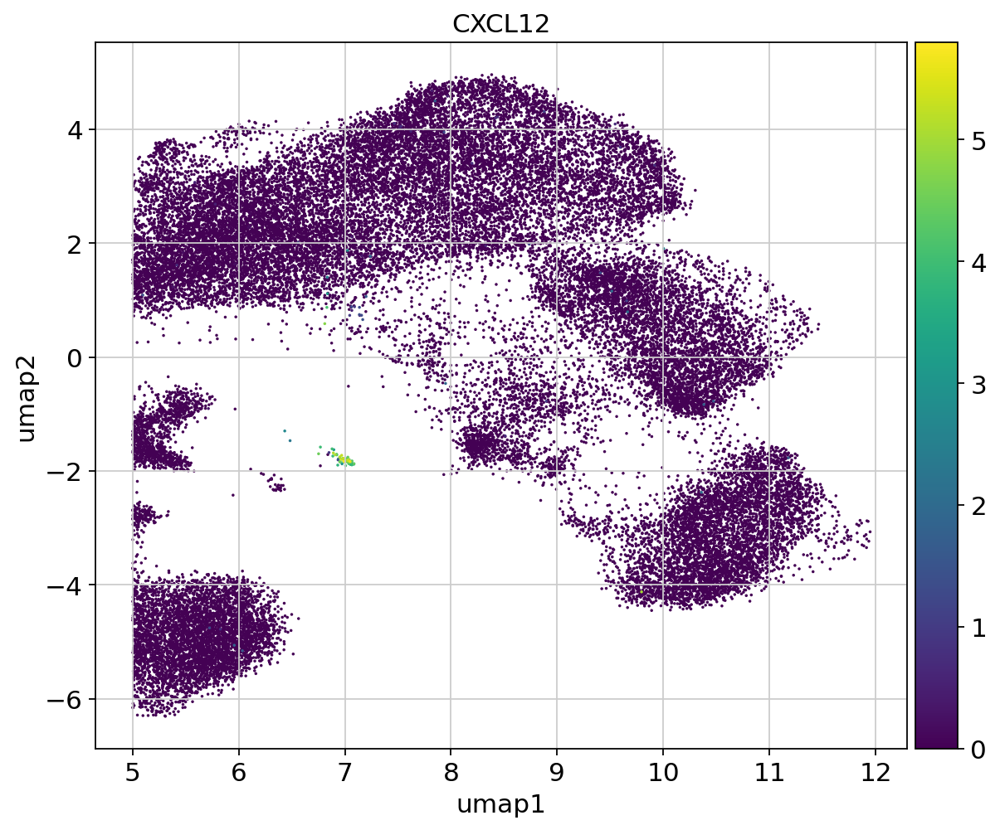

In [8]:
# zoom in on this cluster of cells expressing stromal cell markers
sc.pl.scatter(adata[adata.obs['umap1'] > 5], x='umap1', y='umap2', color='leiden', size=10)
sc.pl.scatter(adata[adata.obs['umap1'] > 5], x='umap1', y='umap2', color='CXCL12', size=10)

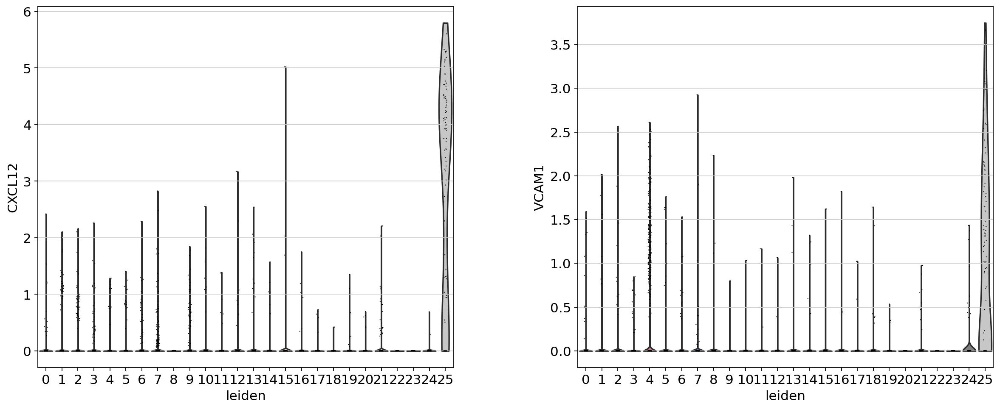

In [9]:
sc.pl.violin(adata,['CXCL12', 'VCAM1'], groupby='leiden')

... storing 'celltype1' as categorical


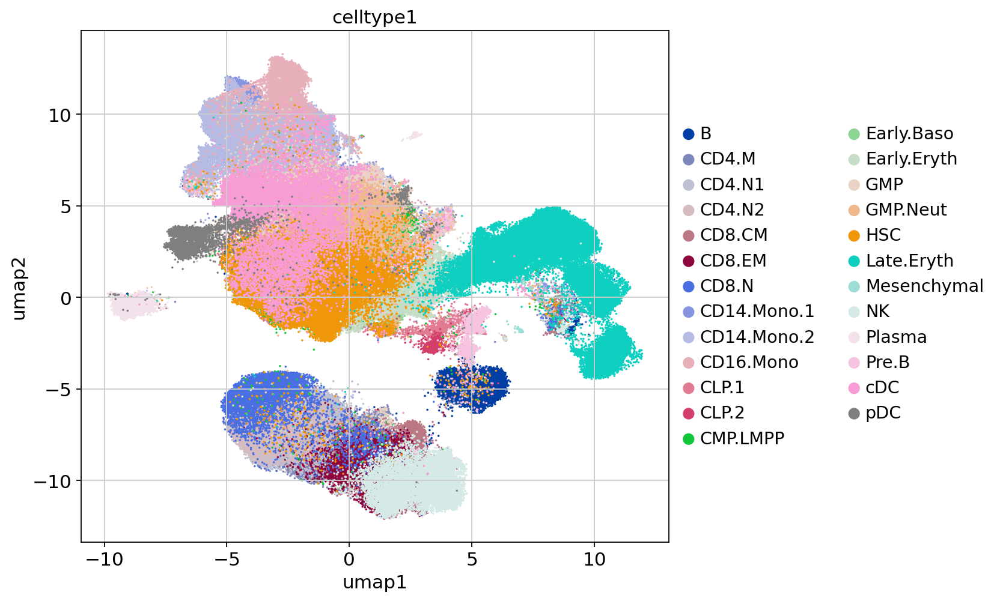

In [18]:
new_celltypes = np.array(adata.obs['celltype'])
new_celltypes[adata.obs['leiden'] == '25'] = 'Mesenchymal'
adata.obs['celltype1'] = new_celltypes
sc.pl.scatter(adata, x='umap1', y='umap2', color='celltype1', size=10)

Now I want to look for megakaryocytes/megakaryocyte progenitors. Markers include ITGA2B, PPBP, PF4.

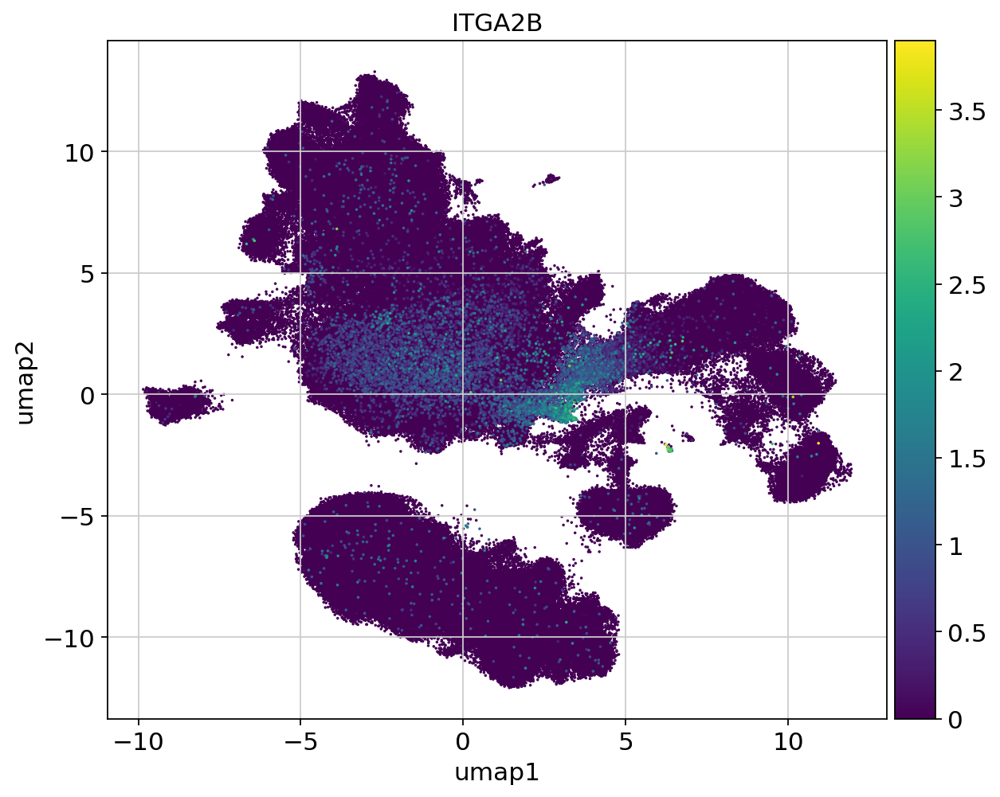

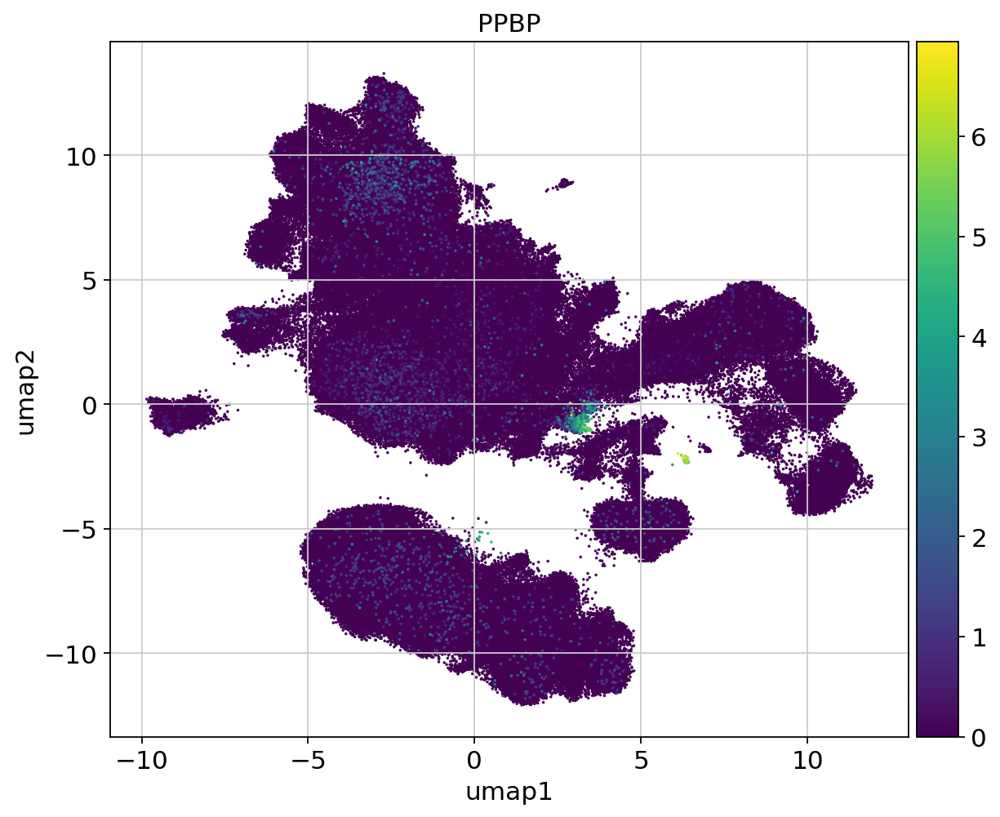

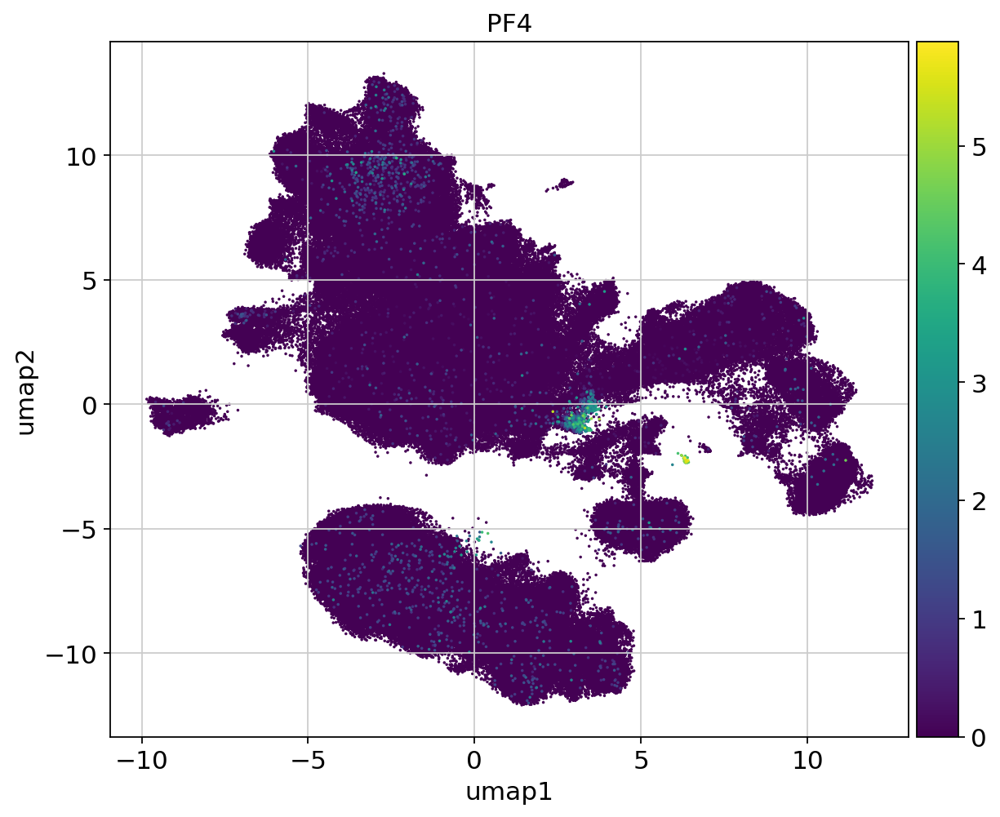

In [19]:
sc.pl.scatter(adata, x='umap1', y='umap2', color='ITGA2B', size=10)
sc.pl.scatter(adata, x='umap1', y='umap2', color='PPBP', size=10)
sc.pl.scatter(adata, x='umap1', y='umap2', color='PF4', size=10)

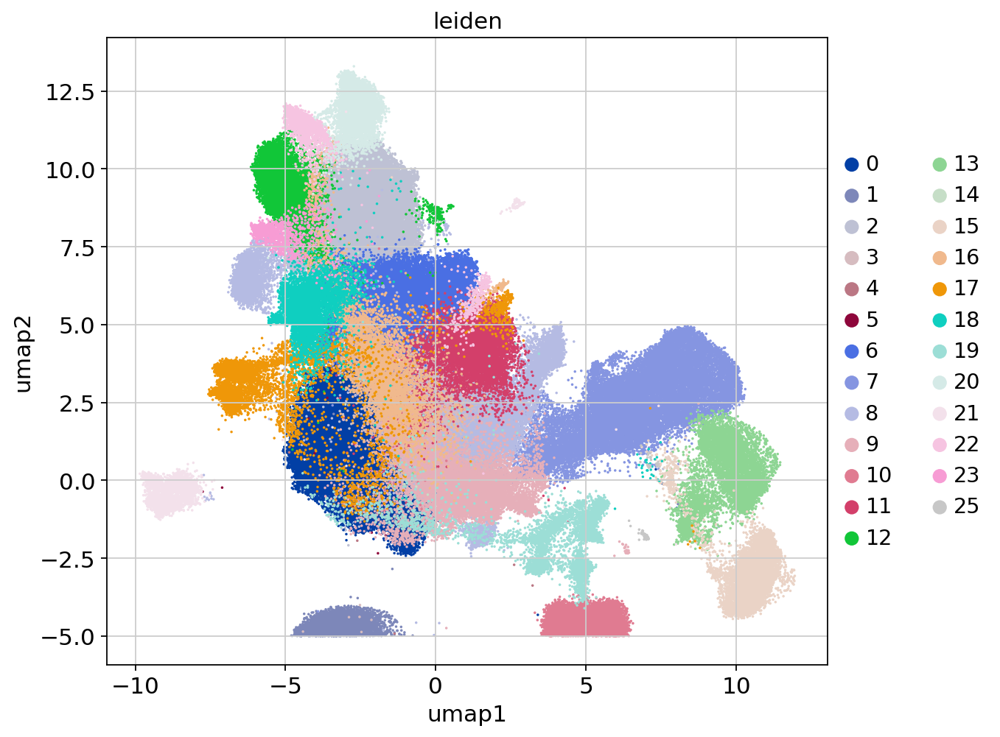

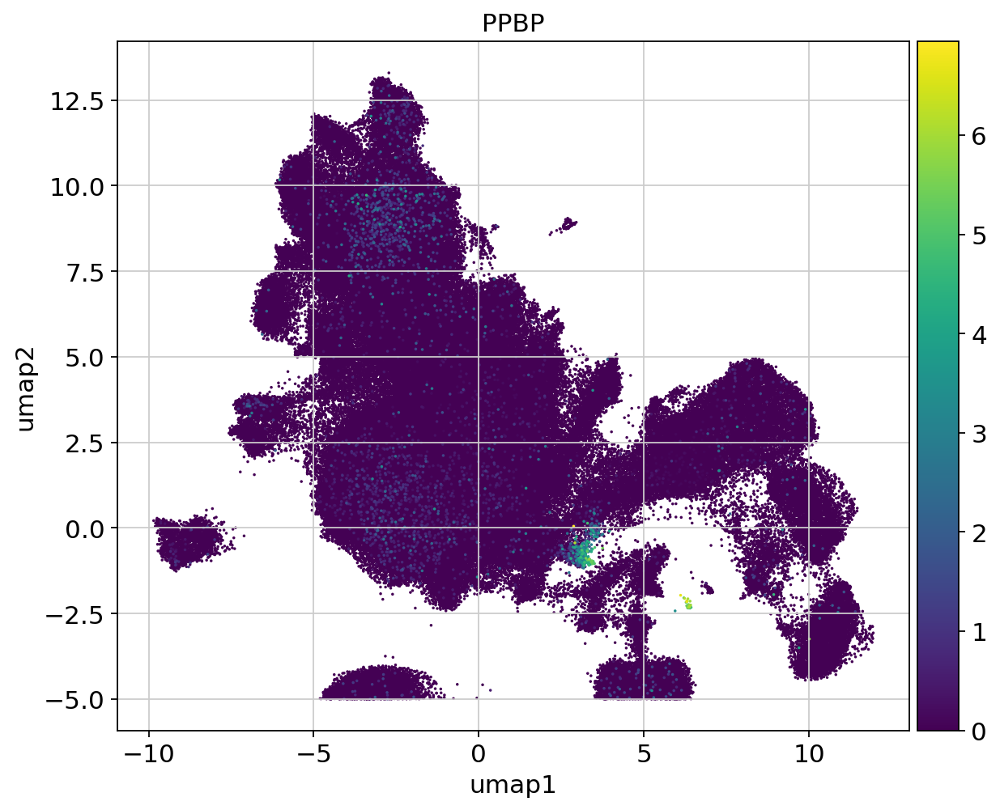

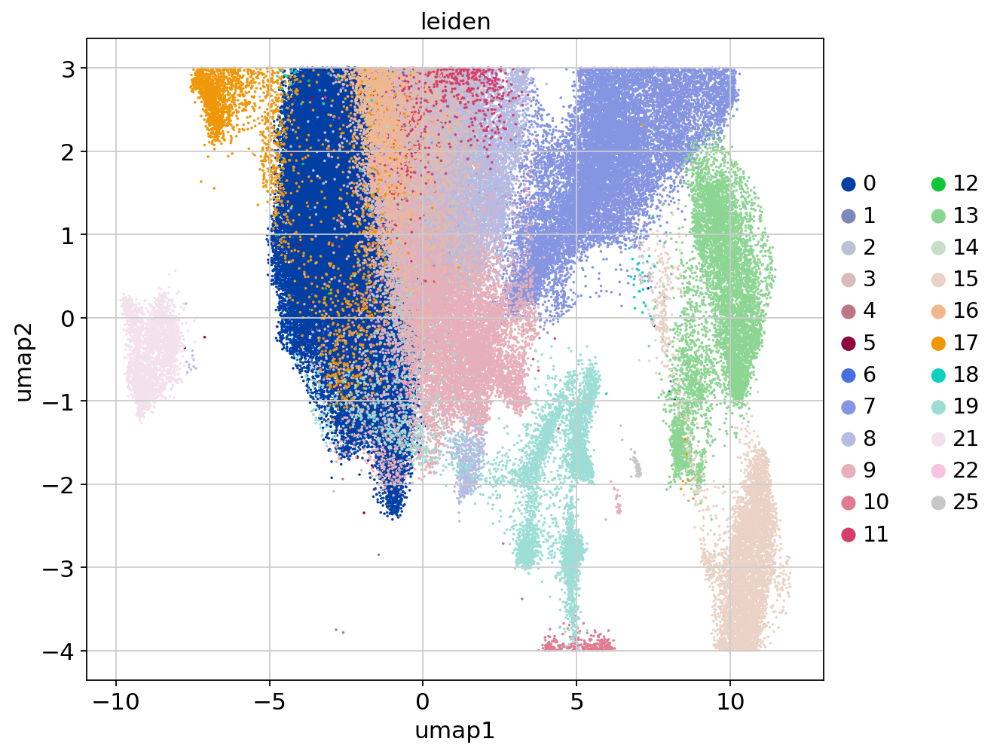

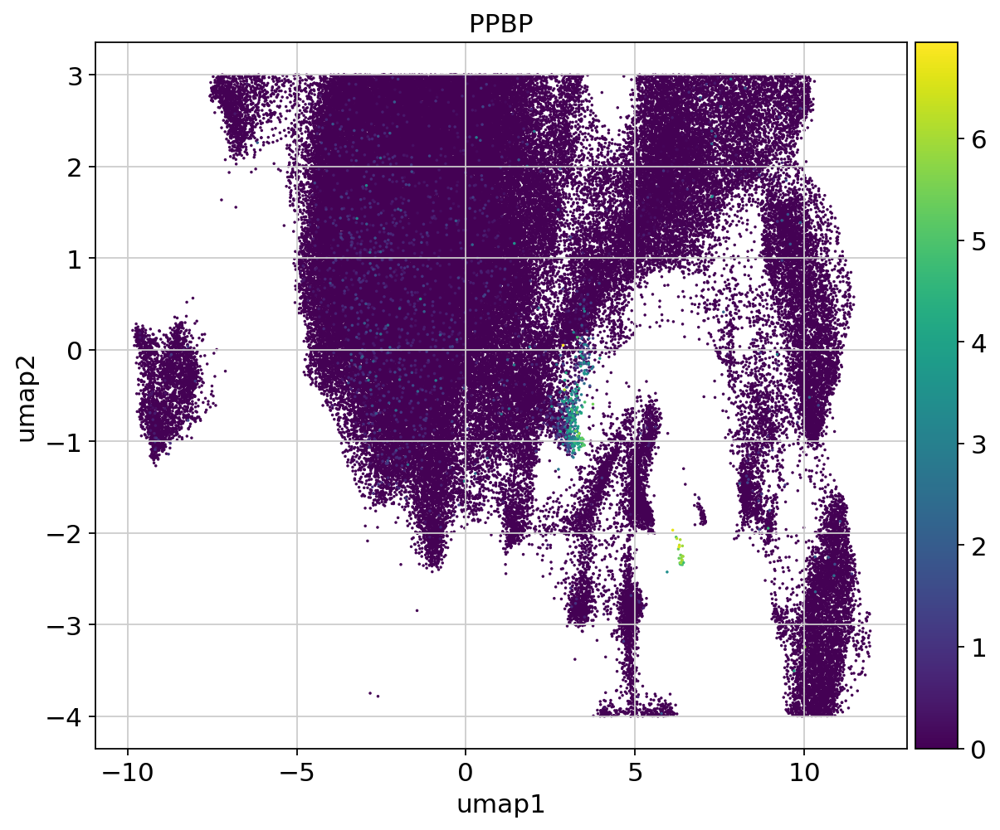

In [20]:
# appears to be 2 clusters of cells expressing megakaryocyte markers - zoom in 
sc.pl.scatter(adata[adata.obs['umap2'] > -5], x='umap1', y='umap2', color='leiden', size=10)
sc.pl.scatter(adata[adata.obs['umap2'] > -5], x='umap1', y='umap2', color='PPBP', size=10)
sc.pl.scatter(adata[(adata.obs['umap2'] > -4) & (adata.obs['umap2'] < 3)], x='umap1', y='umap2', color='leiden', size=10)
sc.pl.scatter(adata[(adata.obs['umap2'] > -4) & (adata.obs['umap2'] < 3)], x='umap1', y='umap2', color='PPBP', size=10)

In [21]:
new_celltypes[((adata[:, 'PPBP'].X > 1).toarray().flatten()) & (adata.obs['leiden'] == '9') & (adata.obs['umap1'] < 5)] = 'Megakaryocytes'
new_celltypes[((adata[:, 'PPBP'].X > 1).toarray().flatten()) & (adata.obs['leiden'] == '9') & (adata.obs['umap1'] > 5)] = 'Megakaryocytes'

... storing 'celltype1' as categorical


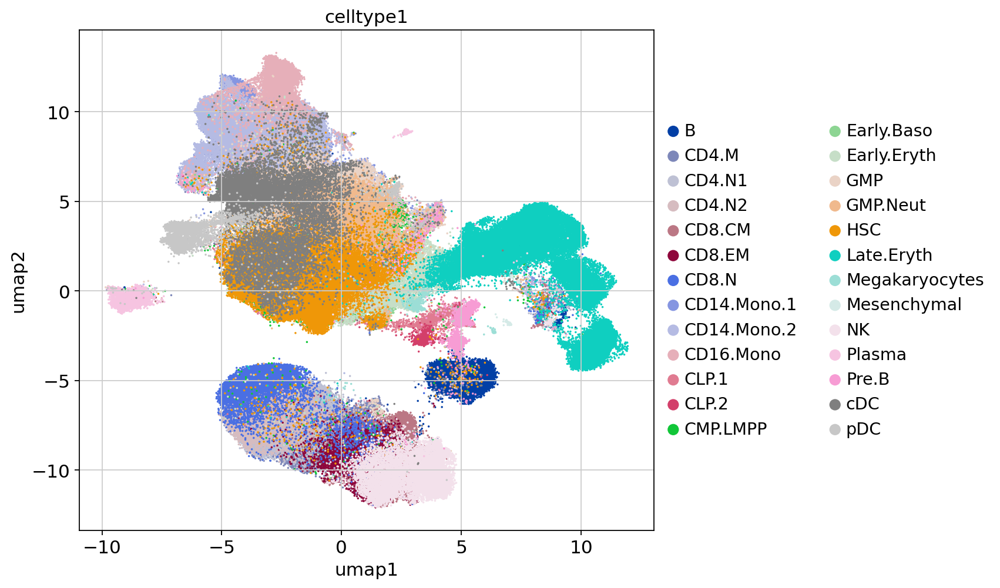

In [25]:
adata.obs['celltype1'] = new_celltypes
del adata.uns['celltype1_colors']
sc.pl.scatter(adata, x='umap1', y='umap2', color='celltype1', size=10)

Why is there one cluster of erythroid cells (cluster 15) really far away from other erythroid cells? And why is there a cluster (cluster 13) that is labelled a mixture of other cells but clusters with erythrocytes?

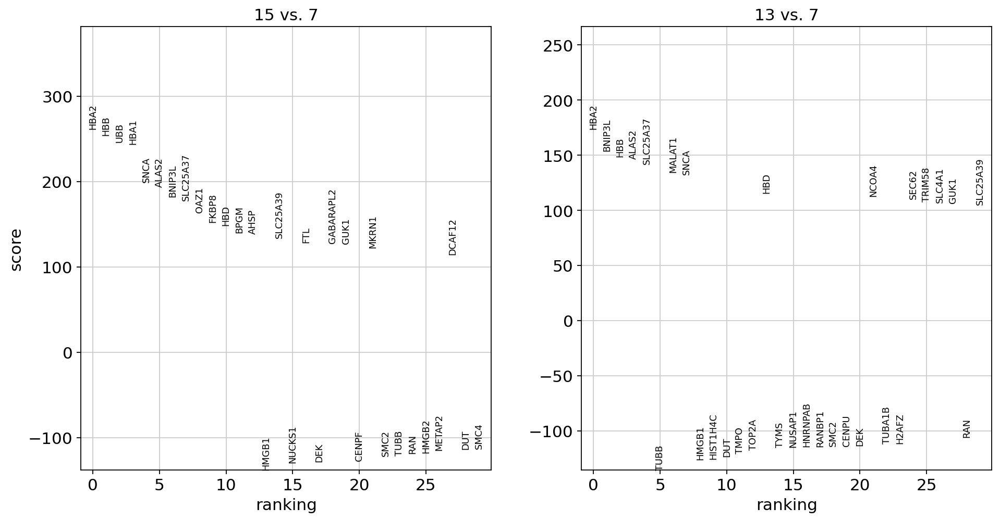

In [26]:
sc.tl.rank_genes_groups(adata, groupby='leiden', groups=['15', '13'], reference='7', key_added='rank_genes_eryth', rankby_abs=True)
sc.pl.rank_genes_groups(adata, key='rank_genes_eryth', n_genes=30, sharey=False)

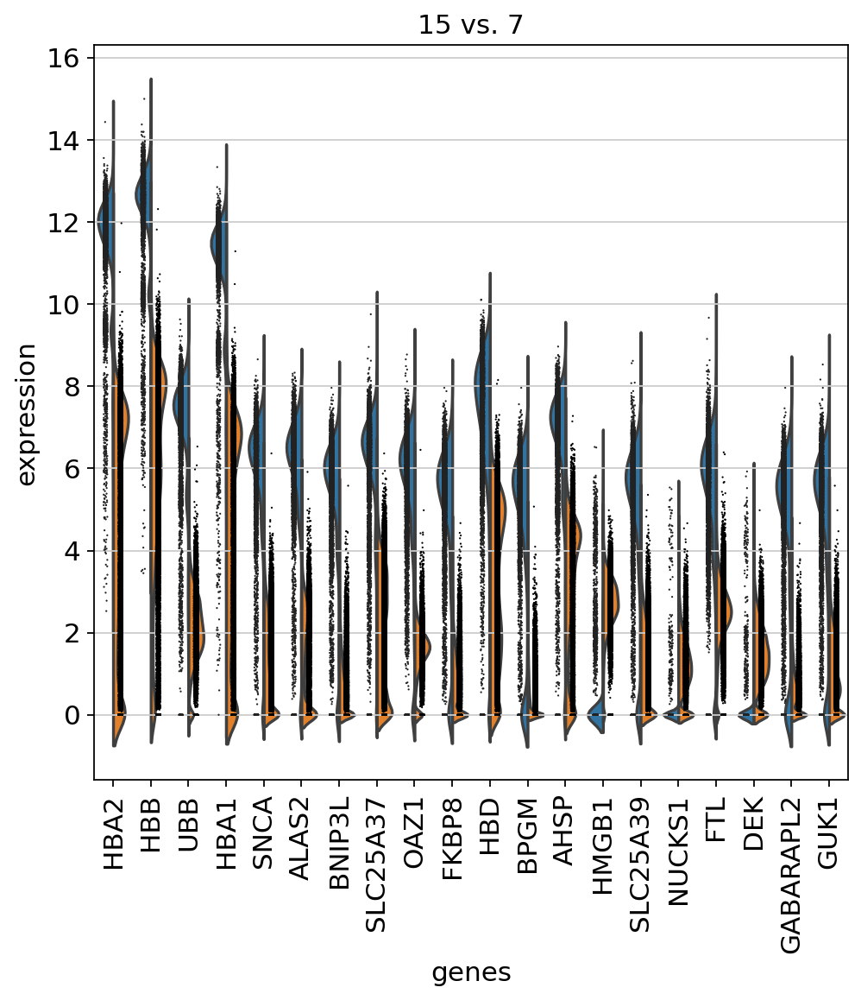

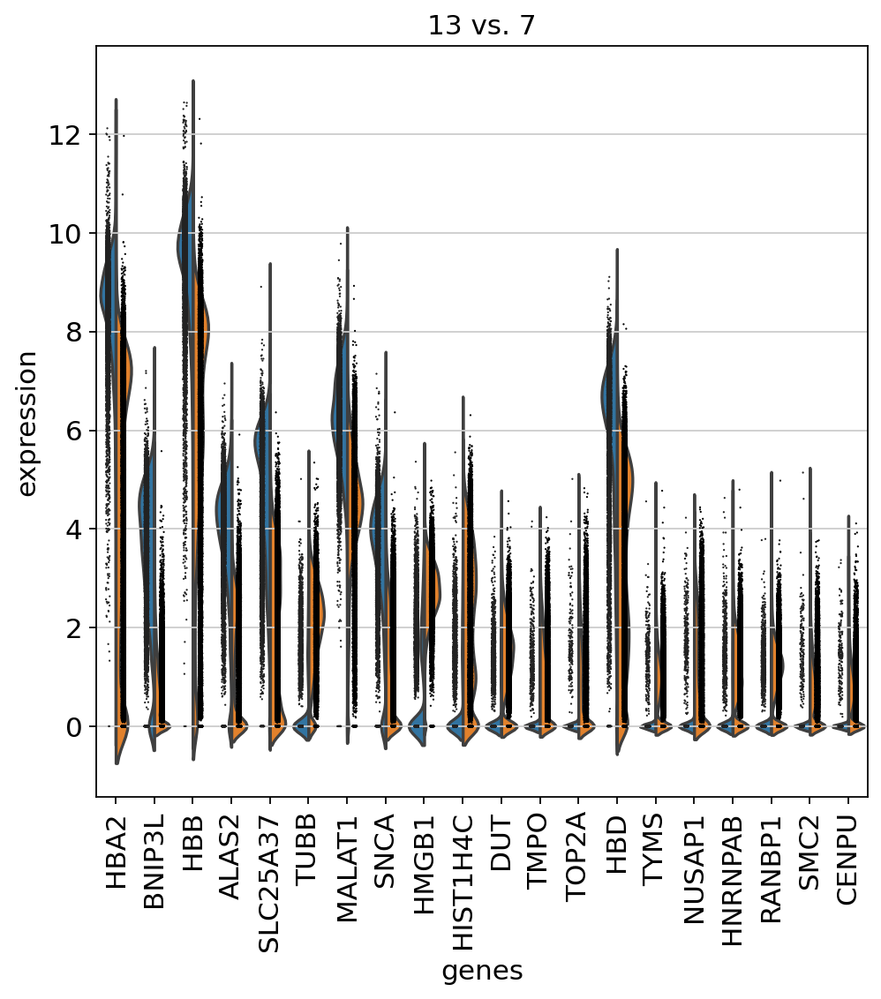

In [27]:
sc.pl.rank_genes_groups_violin(adata, key='rank_genes_eryth')

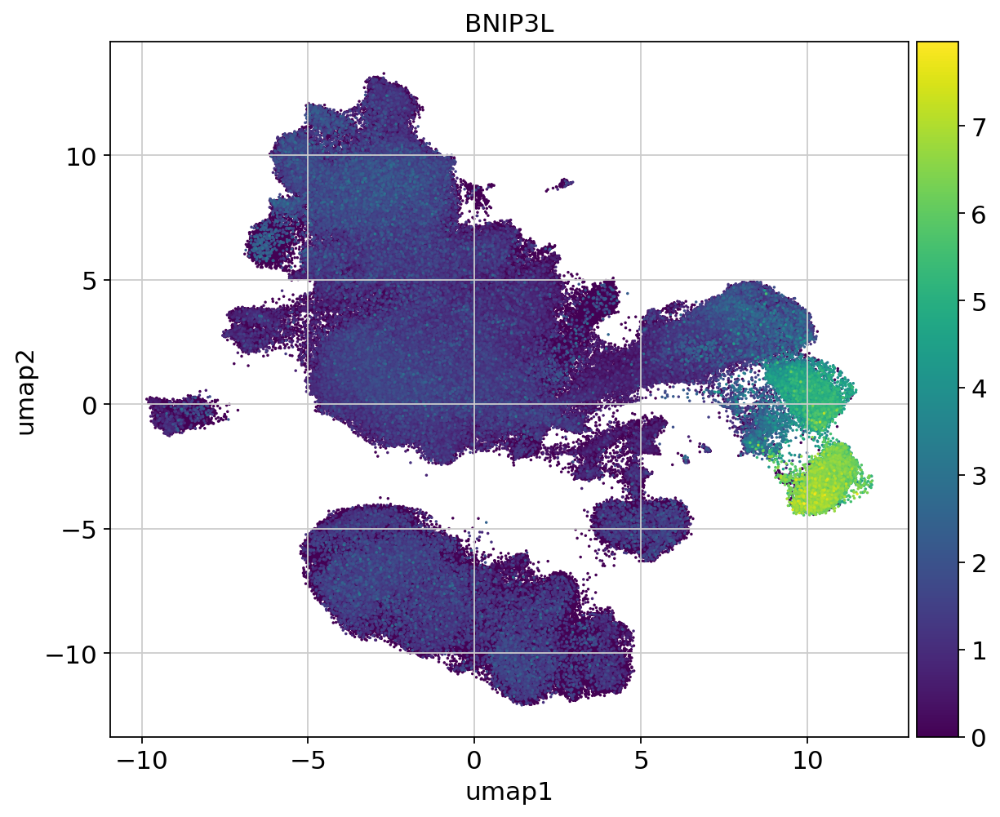

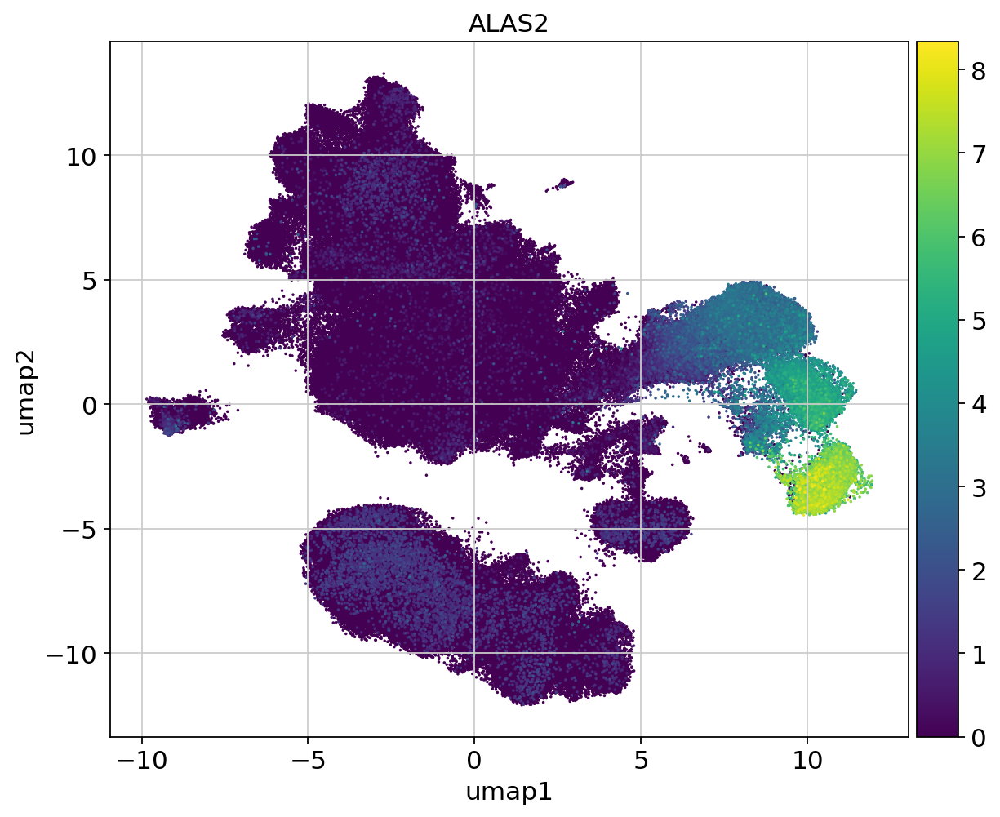

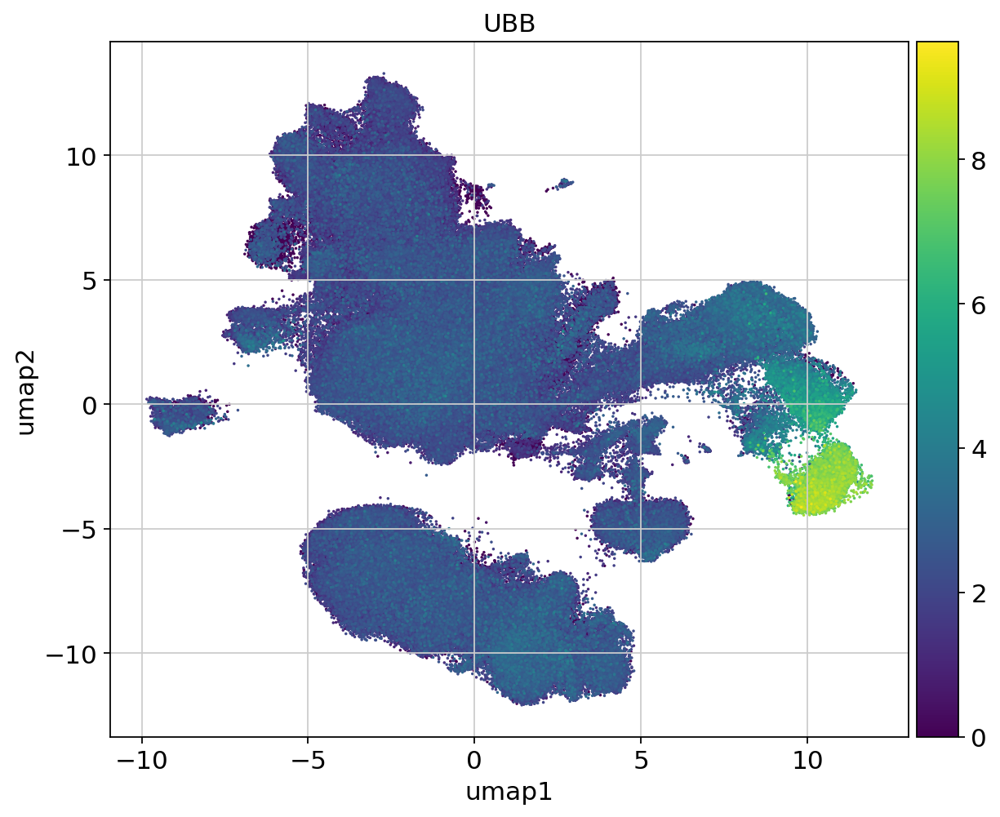

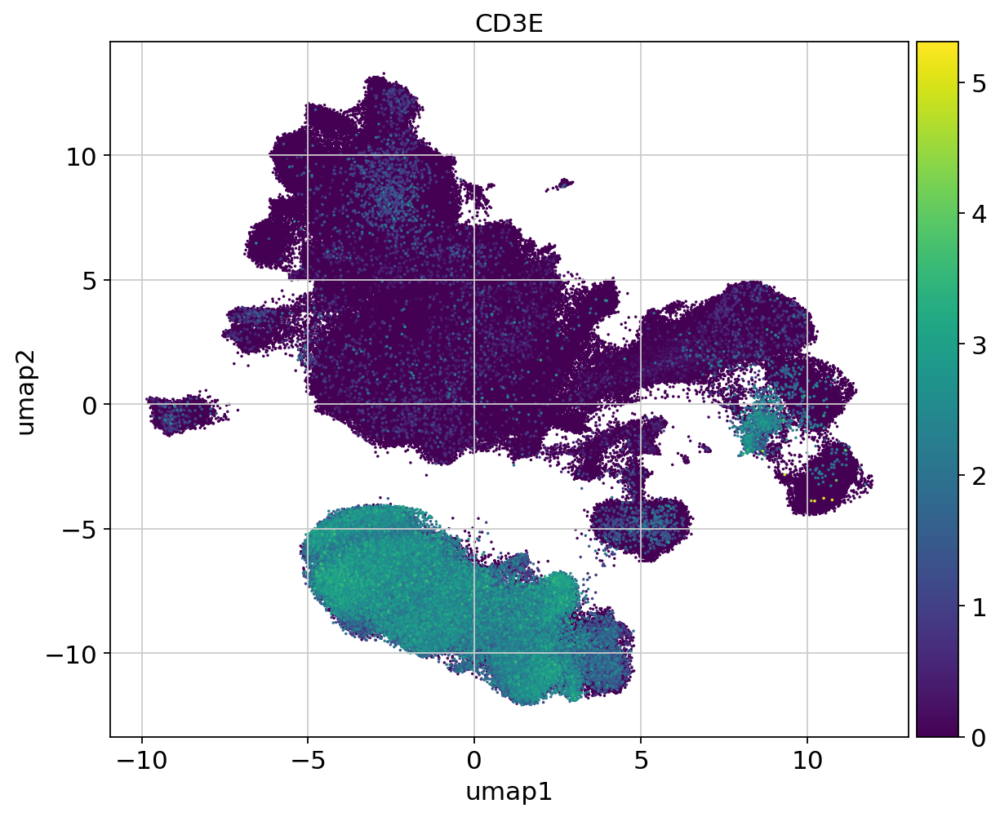

In [28]:
sc.pl.scatter(adata, x='umap1', y='umap2', color='BNIP3L', size=10)
sc.pl.scatter(adata, x='umap1', y='umap2', color='ALAS2', size=10)
sc.pl.scatter(adata, x='umap1', y='umap2', color='UBB', size=10)
sc.pl.scatter(adata, x='umap1', y='umap2', color='CD3E', size=10)

Both of these clusters express high levels of BNIP3L (pro-apoptotic gene), ALAS2 (mitochondrially located), UBB (stress response gene). I'm going to assume cluster 15 represents dead red blood cells and cluster 13 represents instances where dying red blood cell reads contaminated droplets containing other types of cells. 

In [29]:
keep = np.array([True] * adata.n_obs)
keep[adata.obs['leiden'] == '13'] = False
keep[adata.obs['leiden'] == '15'] = False
print(adata.n_obs, sum(keep))

351991 339381


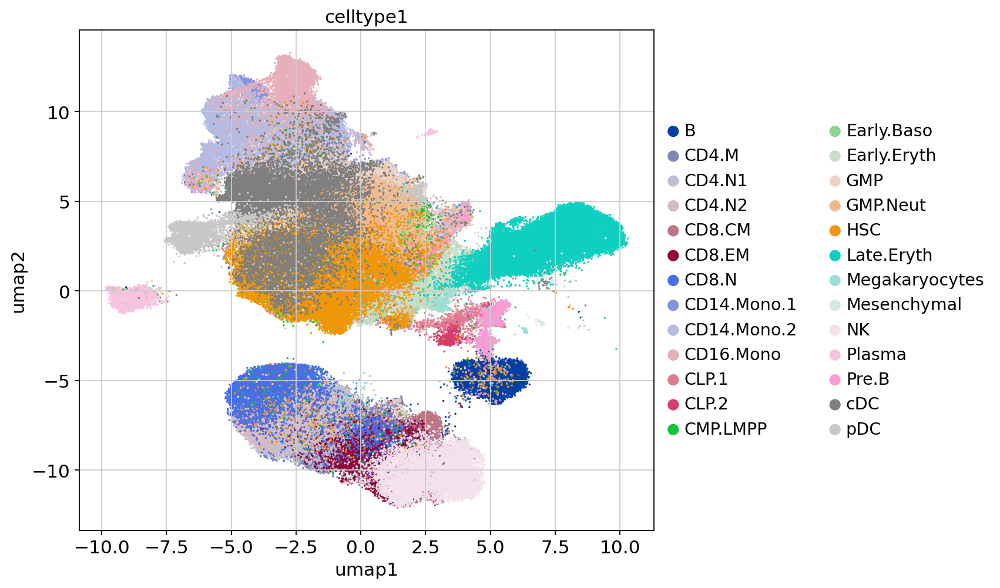

In [30]:
adata.obs['keep'] = keep
sc.pl.scatter(adata[adata.obs['keep'] == True], x='umap1', y='umap2', color='celltype1', size = 10)

Looking a bit cleaner now...

In [31]:
adata.write('../data/bone_marrow_integrated.h5ad')

Some of the celltypes (e.g. CD14.Mono.1 & CD14.Mono.2) could probably be merged together. Going to see how much each celltype correlates with other celltypes.

In [32]:
adata_sub = adata[adata.obs['keep'] == True].copy()
sc.pp.subsample(adata_sub, n_obs=10000)

In [33]:
adata_sub.X = adata_sub.X.todense()

In [34]:
import matplotlib
from matplotlib import colors
rcParams['font.style'] ='normal'
rcParams['font.weight'] = 'medium'
sc.tl.dendrogram(adata_sub, 'celltype1', key_added='dendrogram_celltype1')

         Falling back to preprocessing with `sc.pp.pca` and default params.


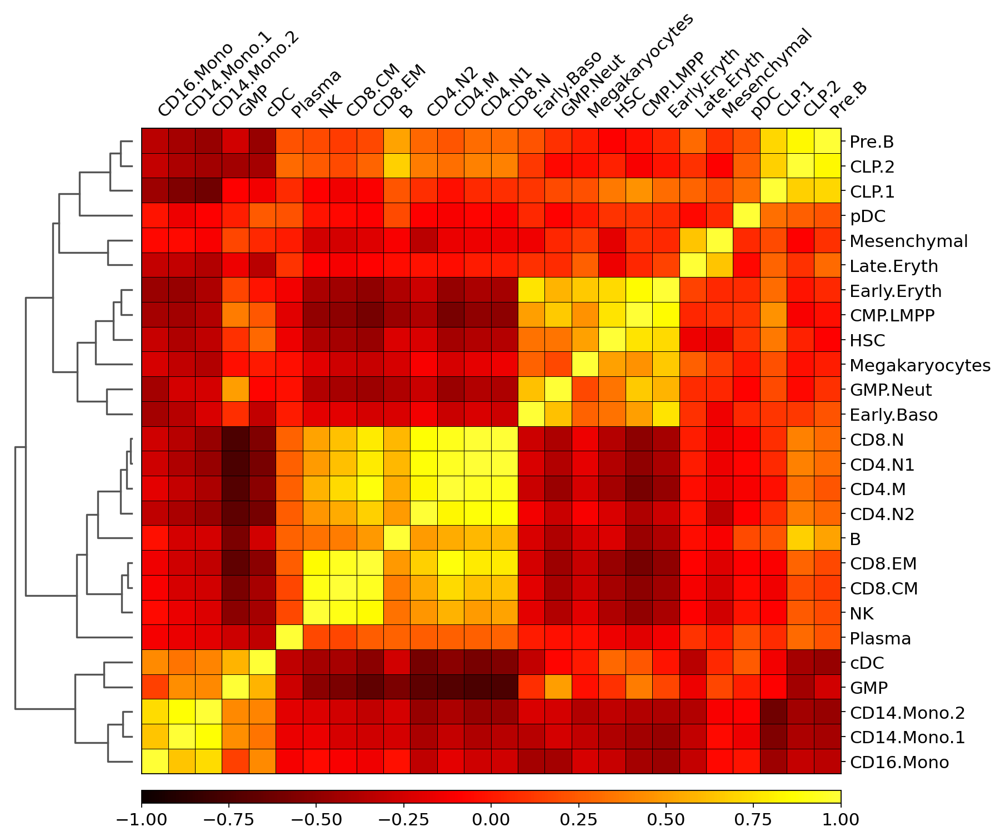

In [35]:
colors3 = plt.cm.hot(np.linspace(0, 0.8, 128))
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colors3)
ax = sc.pl.correlation_matrix(adata_sub, 'celltype1', cmap=mymap, figsize=[12, 10])

In [36]:
# Going to merge a few categories
ct_final = np.array(adata.obs['celltype1'])
ct_final[(ct_final == 'CMP.LMPP') | (ct_final == 'HSC')] = 'HSC.MPP'
ct_final[(ct_final == 'GMP.Neut') | (ct_final == 'GMP')] = 'GMP'
ct_final[(ct_final == 'CD14.Mono.1') | (ct_final == 'CD14.Mono.2')] = 'CD14.Mono'
ct_final[(ct_final == 'CD8.CM') | (ct_final == 'CD8.EM')] = 'CD8.M'
ct_final[(ct_final == 'CD4.N1') | (ct_final == 'CD4.N2')] = 'CD4.N'
ct_final[(ct_final == 'Early.Eryth') | (ct_final == 'Early.Baso')] = 'MEP'
ct_final[(ct_final == 'CLP.1') | (ct_final == 'CLP.2')] = 'CLP'
adata.obs['celltype_final'] = ct_final

In [39]:
adata.obsm['X_umap'] = adata_latent.obsm['X_umap']

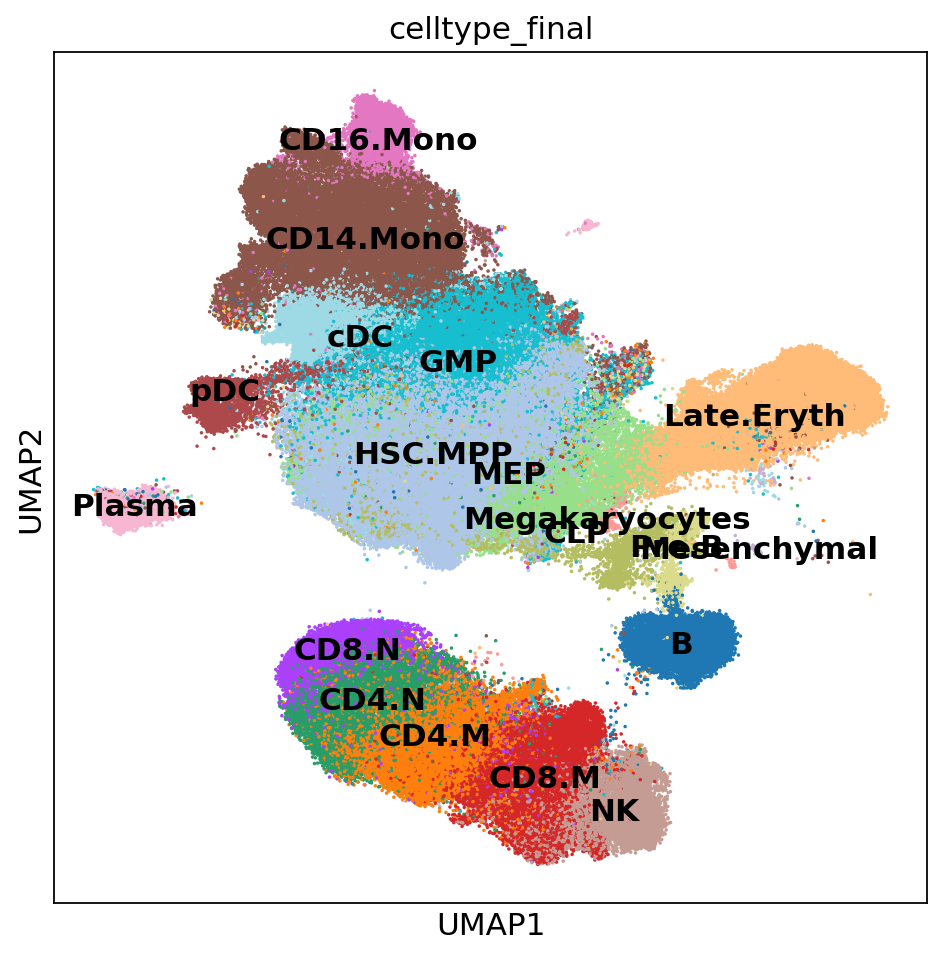

In [41]:
sc.pl.umap(adata[adata.obs['keep'] == True], color=['celltype_final'], size=10, ncols=1, legend_loc='on data')

In [44]:
# remove dead cells and save with final celltype labels
adata = adata[adata.obs['keep'] == True].copy()
adata.write('../data/bone_marrow_integrated.h5ad')

In [45]:
# write out umap data as df to make plots with in R
df = adata.obs[['dataset', 'donor', 'sample', 'timepoint', 'celltype', 'celltype1', 'celltype_final', 'leiden', 'umap1', 'umap2']]
df

,dataset,donor,sample,timepoint,celltype,celltype1,celltype_final,leiden,umap1,umap2
AAACCCACACTATCGA-1-3822_Dg-0-0,nuig_1,3822,3822_Dg,DG,CMP.LMPP,CMP.LMPP,HSC.MPP,0,-1.046485,2.314488
AAACGAAGTCACTCGG-1-3822_Dg-0-0,nuig_1,3822,3822_Dg,DG,CMP.LMPP,CMP.LMPP,HSC.MPP,0,-2.105108,1.576389
AAAGGATAGCTATCCA-1-3822_Dg-0-0,nuig_1,3822,3822_Dg,DG,GMP.Neut,GMP.Neut,GMP,3,-0.579514,3.990118
AAAGGATAGTTGCGAG-1-3822_Dg-0-0,nuig_1,3822,3822_Dg,DG,CD14.Mono.1,CD14.Mono.1,CD14.Mono,2,-3.952255,7.290299
AAAGGATTCGTTGTTT-1-3822_Dg-0-0,nuig_1,3822,3822_Dg,DG,CMP.LMPP,CMP.LMPP,HSC.MPP,0,-1.564875,3.241232
...,...,...,...,...,...,...,...,...,...,...
TTTGTCACACAGACAG-1-3-3-1,petti,170607,Normal_sorted_170607,healthy,Early.Eryth,Early.Eryth,MEP,7,2.899632,1.191651
TTTGTCAGTGACCAAG-1-3-3-1,petti,170607,Normal_sorted_170607,healthy,pDC,pDC,pDC,17,-7.255865,3.451285
TTTGTCAGTTAGATGA-1-3-3-1,petti,170607,Normal_sorted_170607,healthy,CD14.Mono.1,CD14.Mono.1,CD14.Mono,2,-3.041524,9.683847
TTTGTCATCTAGAGTC-1-3-3-1,petti,170607,Normal_sorted_170607,healthy,CD14.Mono.1,CD14.Mono.1,CD14.Mono,2,-1.646257,7.724975


In [46]:
df.to_csv('../data/bone_marrow_integrated_umap.csv', sep = '\t')